In [1]:
import sys
sys.path.append("..")
sys.path.append("../src")
from src import DS_Generator
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from util import TRAIN_SPECIES_DF,SPECIES_SEED ,NUMBER_OF_SPECIES,TRAIN_DATA_PATH
import datetime
from src.Visualizer import nicer_classes
import os
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

In [190]:
_,_,_, df = DS_Generator.DS_Generator().generate_species_data(TRAIN_SPECIES_DF,augment=1,batch_size=64,seed=SPECIES_SEED,return_eval_data=True)
test_df = df[df["which_set"]=="test_ds"]

def prepare_images_mapping(path,labels,species_name):
    img = tf.io.read_file(path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.cast(img, tf.float32)
    img *= (2 / 255)
    img -= 1
    return img,labels,species_name

def create_test_ds_in_order(df):
    image_paths = TRAIN_DATA_PATH + "/" + df["image"]

    image_paths = tf.convert_to_tensor(image_paths, dtype=tf.string)
    labels = tf.convert_to_tensor(df["species_label"], dtype=tf.int32)
    species_name = tf.convert_to_tensor(df["species"].apply(nicer_classes))
    ds = tf.data.Dataset.from_tensor_slices((image_paths,labels,species_name))
    ds = ds.map(prepare_images_mapping,num_parallel_calls=8)
    return ds
test_ds = create_test_ds_in_order(test_df)
test_df.index = range(len(test_df))

We threw away the datapoint with index 11352 


## Load Best Performing model

In [3]:
Input = tf.keras.Input((224,224,3))
base = tf.keras.applications.inception_v3.InceptionV3(
    include_top=False,
    weights='imagenet',
    input_tensor=Input,
    input_shape=None,
    pooling="max",
    classifier_activation='softmax'
)
head = tf.keras.layers.Dense(NUMBER_OF_SPECIES,activation="softmax",)(base.output)
model = tf.keras.Model(inputs=Input, outputs=head,name="Inceptionv3maxpoolimagenet")

# load best performing weighs
model.load_weights("../../models/Inceptionv3maxpoolimagenet/saves/20220330-135917\cp-0006.ckpt")

model.compile(optimizer=tf.keras.optimizers.Adam(0.001),loss="categorical_crossentropy",metrics=["acc",tf.keras.metrics.TopKCategoricalAccuracy(
    k=3, name='top_3_categorical_accuracy'
)])

In [4]:
model.evaluate(test_ds,batch_size=64)

80/80 [==============================] - 16s 127ms/step - loss: 0.2962 - acc: 0.9445 - top_3_categorical_accuracy: 0.9879


[0.29623284935951233, 0.944542407989502, 0.9878503084182739]

In [196]:
predicted_test_data = model.predict(test_ds.batch(64))
np.set_printoptions(suppress=True)
best_3_vals = np.sort(predicted_test_data,axis=1)[:,::-1][:,:3]
best_3_indices = np.argsort(predicted_test_data,axis=1)[:,::-1][:,:3]

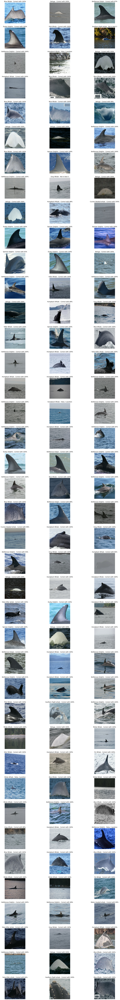

In [326]:
fig = plt.figure(figsize=(20, 160))
columns = 3
rows = 40
for i,(img,label,name) in enumerate(tfds.as_numpy(test_ds.take(columns*rows))):
    
    if label==best_3_indices[i,0]:
        certainty = str(int(100*np.round(best_3_vals[i,0],2)))
        result = f"Correct with {certainty}%"
    elif label in best_3_indices[i]:
        pos = np.argwhere(label==best_3_indices[i])[0][0]
        result = f"False, {pos+1} position"
        
    else:
        result = "Not in best 3"
    
    img = img
    labels = labels
    img+=1
    img/=2
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img)
    name = name.decode("utf-8")
    plt.title(f"{name} - {result}")
    plt.axis("off")
plt.show()

In [312]:
def calculate_class_accuracy(species):
    df = test_df[test_df["species"]==species]
    species_label = df["species_label"].iloc[0]

    acc = np.round(np.mean(best_3_indices[df.index.tolist(),0]==species_label),2)
    top_3_acc = np.round(np.mean([species_label in arr for arr in best_3_indices[df.index.tolist()]]),2)
    count = np.round(len(df)/len(test_df),2)
    return acc,top_3_acc,count

In [313]:
class_acc = {}
class_top3_acc = {}
class_freq = {}
for species in test_df["species"].unique():
    name = nicer_classes(species) 
    class_acc[name], class_top3_acc[name], class_freq[name] = calculate_class_accuracy(species)


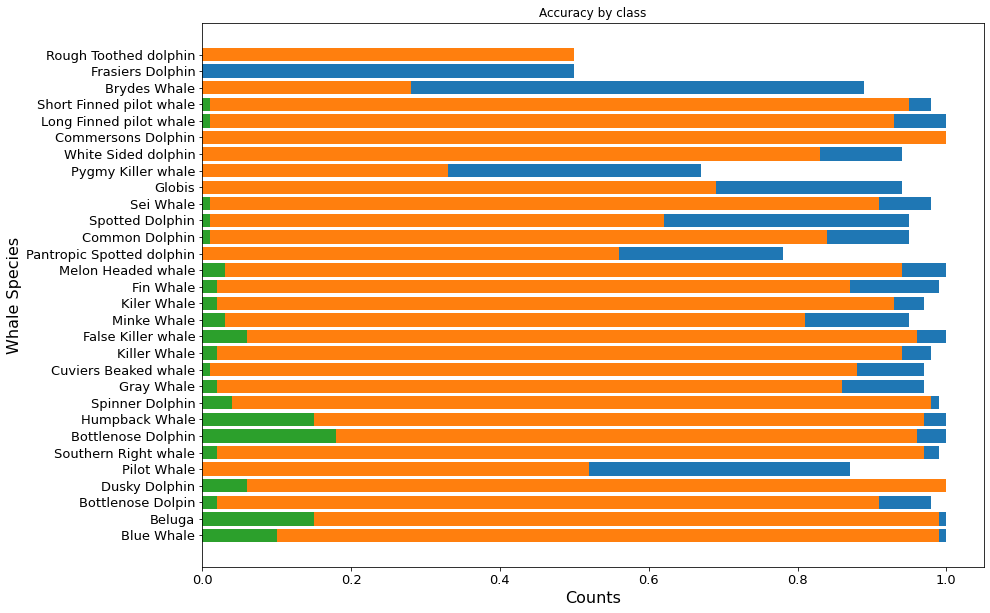

In [324]:
fig, ax = plt.subplots(figsize=(14, 10))
names = list(class_acc.keys())

ax.barh(names , class_top3_acc .values())
ax.barh(names , class_acc .values())
ax.barh(names , class_freq.values())

plt.title("Accuracy by class")
plt.xticks(rotation=0)
plt.tick_params(axis='y', labelsize=13)
plt.tick_params(axis='x', labelsize=13)
plt.ylabel('Whale Species', fontsize=16)
plt.xlabel('Counts', fontsize=16)
plt.show()